In [1]:
import pandas as pd
import numpy as np
import pandas_profiling

from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, LabelEncoder
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split,RandomizedSearchCV
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix

import lime
import lime.lime_tabular

In [2]:
np.set_printoptions(precision=3, linewidth=100)

In [3]:
df = pd.read_csv("https://raw.githubusercontent.com/amueller/scipy-2017-sklearn/master/notebooks/datasets/titanic3.csv")

In [4]:
pandas_profiling.ProfileReport(df)

In [5]:
target = df['survived'].values
features = df[['pclass', 'sex', 'age', 'fare', 'embarked']].copy()

In [6]:
features.head()

,pclass,sex,age,fare,embarked
0,1,female,29.0000,211.3375,S
1,1,male,0.9167,151.5500,S
2,1,female,2.0000,151.5500,S
3,1,male,30.0000,151.5500,S
4,1,female,25.0000,151.5500,S


In [7]:
X_train, X_test, y_train, y_test = train_test_split(features, target, random_state=0)

In [8]:
numerical_features = features.columns[(features.dtypes != 'object') &  (features.dtypes != 'category')].tolist()
categorical_features = features.columns[(features.dtypes == 'object') |  (features.dtypes == 'category')].tolist()

In [9]:
numeric_pipeline = Pipeline(steps=[('imputer',SimpleImputer()), ('scaler',StandardScaler())])
cat_pipeline = Pipeline(steps=[('imputer',SimpleImputer(strategy='most_frequent')),('onehot',OneHotEncoder())])

transformers = [
('num', numeric_pipeline, numerical_features),
('cat', cat_pipeline, categorical_features)
]

preprocess = ColumnTransformer(transformers,)

In [10]:
model = Pipeline([('preprocess',preprocess),('estimator',RandomForestClassifier())])

In [11]:
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

# Create the random grid
random_grid = {'estimator__n_estimators': n_estimators,
               'estimator__max_features': max_features,
               'estimator__max_depth': max_depth,
               'estimator__min_samples_split': min_samples_split,
               'estimator__min_samples_leaf': min_samples_leaf,
               'estimator__bootstrap': bootstrap}

In [12]:
grid_clf = RandomizedSearchCV(estimator = model, param_distributions = random_grid, n_iter = 20, cv = 5, verbose=2, n_jobs = -1)
grid_clf.fit(X_train, y_train);

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.8min finished


In [13]:
model_final = grid_clf.best_estimator_
onehot_columns = model_final.named_steps['preprocess'].named_transformers_['cat'].named_steps['onehot'].get_feature_names(input_features=categorical_features)
feature_importance = pd.Series(data= model_final.named_steps['estimator'].feature_importances_, index = np.array(numerical_features + list(onehot_columns)))
feature_importance

pclass        0.126123
age           0.156000
fare          0.207684
sex_female    0.245107
sex_male      0.224601
embarked_C    0.018434
embarked_Q    0.006491
embarked_S    0.015560
dtype: float64

In [14]:
print(f"The accuracy of this model is {100*model_final.score(X_test, y_test):.1f}%")

The accuracy of this model is 81.1%


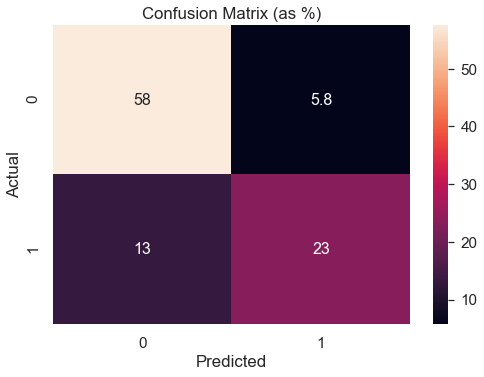

In [15]:
import seaborn as sn
import matplotlib.pyplot as plt
cm = 100*confusion_matrix(y_test,model_final.predict(X_test), normalize='all')
df_cm = pd.DataFrame(cm, range(2),range(2))
sn.set(font_scale=1.4)#for label size
ax = sn.heatmap(df_cm, annot=True,annot_kws={"size": 16})# font size
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
ax.set_title("Confusion Matrix (as %)")
plt.show()

In [16]:
df_lime = df.copy()
class_names = df_lime['survived'].unique()

In [17]:
X_train_lime, X_test_lime, y_train_lime, y_test_lime = train_test_split(df_lime[features.columns],
                                                    df_lime['survived'],
                                                    test_size = 0.2,
                                                    random_state=0)

In [18]:
lime_numeric_pipeline = Pipeline(steps=[('imputer',SimpleImputer())])
lime_cat_pipeline = Pipeline(steps=[('imputer',SimpleImputer(strategy='most_frequent')),('encode',OrdinalEncoder())])

lime_transformers = [
('num', lime_numeric_pipeline, numerical_features),
('cat', lime_cat_pipeline, categorical_features)
]

lime_preprocess = ColumnTransformer(lime_transformers,)

In [19]:
lime_preprocess.fit(df_lime[features.columns]);
X_train_lime2 = lime_preprocess.transform(X_train_lime)

In [20]:
categorical_names = {}
for i,feature in enumerate(categorical_features):
    categorical_names[feature] = lime_preprocess.named_transformers_['cat'].named_steps['encode'].categories_[i] 

In [25]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_lime2 ,feature_names = numerical_features + categorical_features,class_names=['Deceased','Survived'],categorical_features=categorical_features, categorical_names=categorical_names,kernel_width=3)

In [22]:
rf = RandomForestClassifier()
rf.fit(X_train_lime2, y_train_lime);

In [26]:
for i in range(5):
    exp = explainer.explain_instance(X_train_lime2[i], rf.predict_proba, num_features=6)
    exp.show_in_notebook(show_all=True)